# Evaluation

## Setup

In [2]:
!pip install torchmetrics

  Using cached torchmetrics-1.5.1-py3-none-any.whl.metadata (20 kB)
  Using cached lightning_utilities-0.11.8-py3-none-any.whl.metadata (5.2 kB)
Using cached torchmetrics-1.5.1-py3-none-any.whl (890 kB)
Using cached lightning_utilities-0.11.8-py3-none-any.whl (26 kB)


In [3]:
!pip install tqdm


## ResNet50 vs VGG-16

/tmp/ipykernel_17/3634100300.py:114: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet_model.load_state_dict(torch.load(resnet_weights_path, map_location=device))
/tmp/ip

ResNet Model - Loss: 0.0491, IoU: 0.7716, Accuracy: 98.11%
VGG16 Model - Loss: 0.0680, IoU: 0.6372, Accuracy: 97.20%


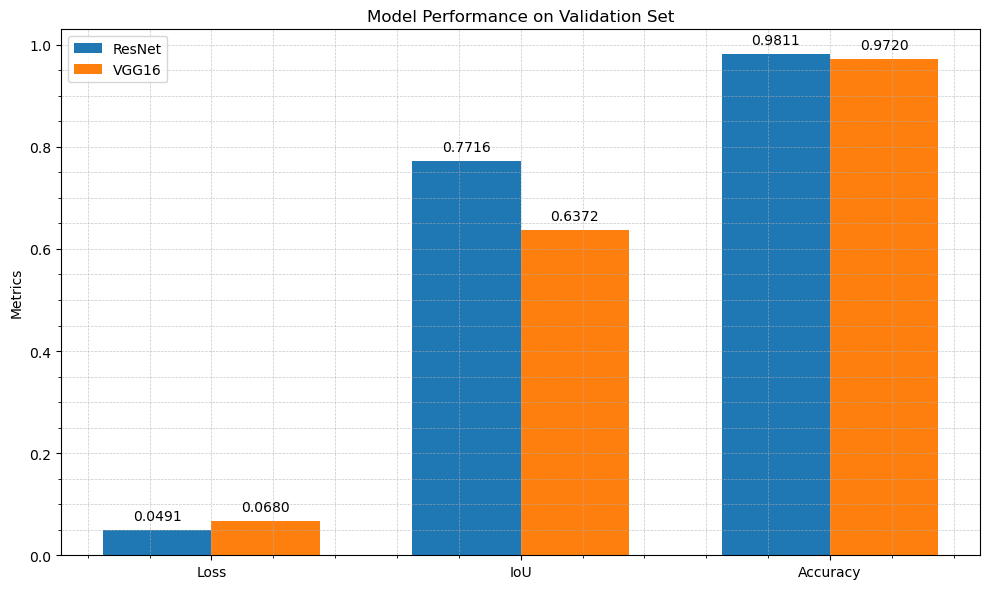

ResNet Model Predictions:


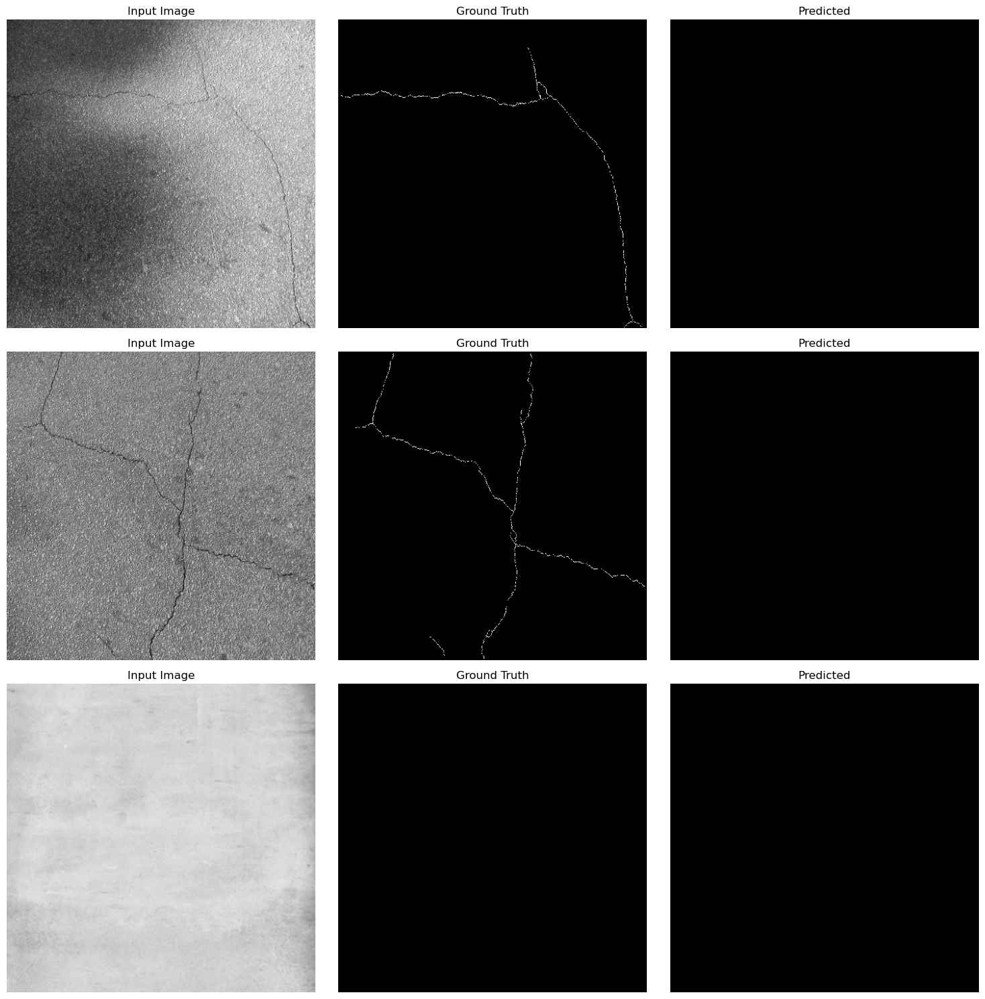

VGG16 Model Predictions:


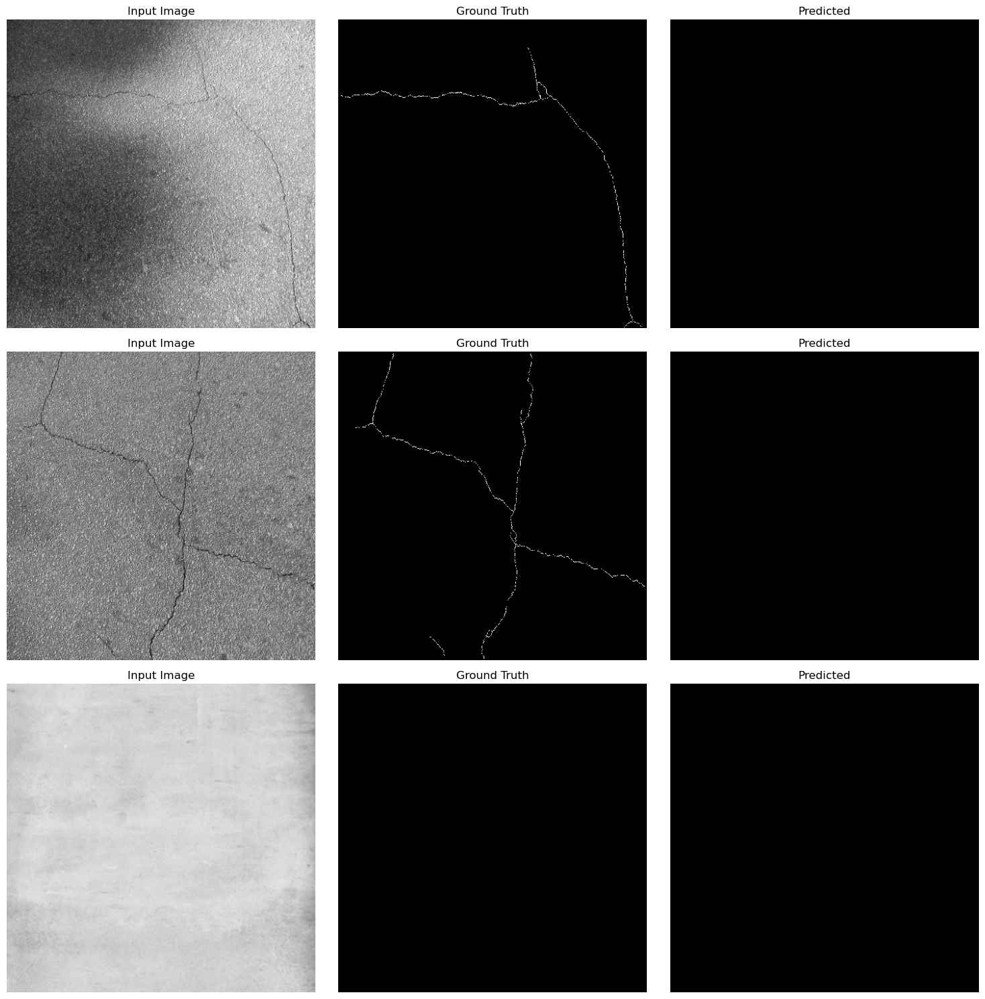

In [25]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from torch import nn
from tqdm import tqdm
from torchmetrics import JaccardIndex
import torch.nn.functional as F

# Paths to weights and input data
resnet_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/res_net_best_weight.pth'
resnet_input_path = 'extracted_dataset/crack_segmentation_dataset'
resnet_batch_size = 8

vgg16_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/vgg16_origin_best_weight.pth'
vgg16_input_path = 'extracted_dataset/crack_segmentation_dataset'
vgg16_batch_size = 8
H = 448
W = 448

# Define data transforms
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

data_transforms = {
    'train': transforms.Compose([
        transforms.ToTensor(),
        normalize
    ]),
    'validation': transforms.Compose([
        transforms.ToTensor(),
        normalize
    ]),
}

# Dataset class
class CrackDataSet(Dataset):
    def __init__(self, data, data_transforms):
        self.data_transforms = data_transforms
        self.data = data

    def __len__(self):
        return len(self.data[0])  # Number of images

    def __getitem__(self, index):
        # Load image and apply transformations
        image = cv2.imread(self.data[0][index], cv2.IMREAD_COLOR)
        image = self.data_transforms(
            Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        )

        # Load mask and convert to labels
        mask = cv2.imread(self.data[1][index], cv2.IMREAD_GRAYSCALE)
        mask_label = np.zeros(mask.shape)
        mask_label[mask >= 128] = 1
        mask_label = torch.LongTensor(mask_label.astype(np.int64))
        return image, mask_label

# Load data
def load_data(path=''):
    images = sorted(glob(os.path.join(path, "images/*")))
    masks = sorted(glob(os.path.join(path, "masks/*")))
    train_x, valid_x, train_y, valid_y = train_test_split(
        images, masks, test_size=0.2, random_state=42
    )
    return (train_x, train_y), (valid_x, valid_y)

# Load validation data
_, (valid_x, valid_y) = load_data(path=resnet_input_path)

# Create validation dataset and loader
val_dataset = CrackDataSet((valid_x, valid_y), data_transforms['validation'])
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

# Define the models
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

def create_resnet_model(num_classes=2):
    # Load pretrained weights
    weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
    model = deeplabv3_resnet50(weights=weights, progress=True)
    # Replace the classifier for 2 classes (ground, crack)
    model.classifier = DeepLabHead(2048, num_classes)
    model.train()
    return model

# VGG16 model for segmentation
class VGG16Segmentation(nn.Module):
    def __init__(self, num_classes):
        super(VGG16Segmentation, self).__init__()
        vgg = models.vgg16(pretrained=True)
        self.features = vgg.features
        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)

    def forward(self, x):
        x = self.features(x)
        x = self.final_conv(x)
        x = F.interpolate(x, size=(H, W), mode='bilinear', align_corners=True)
        return x

# Load models and weights
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 2

# ResNet model
resnet_model = create_resnet_model(num_classes=num_classes)
resnet_model.load_state_dict(torch.load(resnet_weights_path, map_location=device))
resnet_model.to(device)
resnet_model.eval()

# VGG16 model
vgg16_model = VGG16Segmentation(num_classes=num_classes)
vgg16_model.load_state_dict(torch.load(vgg16_weights_path, map_location=device))
vgg16_model.to(device)
vgg16_model.eval()

# Define loss function and metric
loss_criterion = nn.CrossEntropyLoss()
iou_metric = JaccardIndex(task='multiclass', num_classes=num_classes).to(device)

# Evaluation function
def evaluate_model(model, data_loader):
    model.eval()
    total_loss = 0.0
    total_iou = 0.0
    total_correct = 0.0
    total_pixels = 0
    num_batches = 0

    with torch.no_grad():
        for data, target in tqdm(data_loader, desc="Evaluating"):
            data = data.to(device)
            target = target.to(device)

            output = model(data)
            if isinstance(output, dict) and 'out' in output:
                output = output['out']
            # Compute loss
            loss = loss_criterion(output, target)
            total_loss += loss.item() * data.size(0)

            # Compute IoU
            total_iou += iou_metric(output, target).item()

            # Compute accuracy
            preds = torch.argmax(output, dim=1)
            total_correct += torch.sum(preds == target).item()
            total_pixels += torch.numel(target)

            num_batches += 1

    avg_loss = total_loss / len(data_loader.dataset)
    avg_iou = total_iou / num_batches
    avg_accuracy = total_correct / total_pixels

    return avg_loss, avg_iou, avg_accuracy

# Evaluate models
resnet_loss, resnet_iou, resnet_accuracy = evaluate_model(resnet_model, val_loader)
vgg16_loss, vgg16_iou, vgg16_accuracy = evaluate_model(vgg16_model, val_loader)

print(f"ResNet Model - Loss: {resnet_loss:.4f}, IoU: {resnet_iou:.4f}, Accuracy: {resnet_accuracy*100:.2f}%")
print(f"VGG16 Model - Loss: {vgg16_loss:.4f}, IoU: {vgg16_iou:.4f}, Accuracy: {vgg16_accuracy*100:.2f}%")

# Plotting the metrics
metrics = ['Loss', 'IoU', 'Accuracy']
resnet_metrics = [resnet_loss, resnet_iou, resnet_accuracy]
vgg16_metrics = [vgg16_loss, vgg16_iou, vgg16_accuracy]

x = np.arange(len(metrics))  # Label locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, resnet_metrics, width, label='ResNet', color='#1f77b4')
rects2 = ax.bar(x + width/2, vgg16_metrics, width, label='VGG16', color='#ff7f0e')

# Add labels, title, and custom x-axis tick labels
ax.set_ylabel('Metrics')
ax.set_title('Model Performance on Validation Set')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
ax.minorticks_on()

def autolabel(rects):
    """Attach a text label above each bar"""
    for rect in rects:
        height = rect.get_height()
        if isinstance(height, torch.Tensor):
            height = height.item()
        ax.annotate(f'{height:.4f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 5),  # Vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.show()

# Visualize sample predictions
def visualize_predictions(model, data_loader, num_images=5):
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(15, num_images * 5))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(data_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            if isinstance(outputs, dict) and 'out' in outputs:
                outputs = outputs['out']
            preds = torch.argmax(outputs, dim=1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images, 3, images_so_far * 3 - 2)
                img = inputs.cpu().data[j].numpy().transpose((1, 2, 0))
                img = np.clip(
                    img * np.array([0.229, 0.224, 0.225]) +
                    np.array([0.485, 0.456, 0.406]), 0, 1
                )
                ax.imshow(img)
                ax.set_title('Input Image')
                ax.axis('off')

                ax = plt.subplot(num_images, 3, images_so_far * 3 - 1)
                ax.imshow(labels.cpu().data[j], cmap='gray')
                ax.set_title('Ground Truth')
                ax.axis('off')

                ax = plt.subplot(num_images, 3, images_so_far * 3)
                ax.imshow(preds.cpu().data[j], cmap='gray')
                ax.set_title('Predicted')
                ax.axis('off')

                if images_so_far == num_images:
                    plt.tight_layout()
                    plt.show()
                    return
    plt.tight_layout()
    plt.show()

print("ResNet Model Predictions:")
visualize_predictions(resnet_model, val_loader, num_images=10)

print("VGG16 Model Predictions:")
visualize_predictions(vgg16_model, val_loader, num_images=10)



### Unseen Images

Using device: cuda


/tmp/ipykernel_17/2410436244.py:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet_state_dict = torch.load(resnet_weights_path, map_location=device)


ResNet model loaded and moved to device successfully.


/tmp/ipykernel_17/2410436244.py:84: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vgg16_state_dict = torch.load(vgg16_weights_path, map_location=device)


VGG16 model loaded and moved to device successfully.
Parameter 'backbone.conv1.weight' is on cuda:0, expected cuda
Parameter 'features.0.weight' is on cuda:0, expected cuda
Input image tensor is on device: cuda:0
ResNet prediction completed successfully.
VGG16 prediction completed successfully.


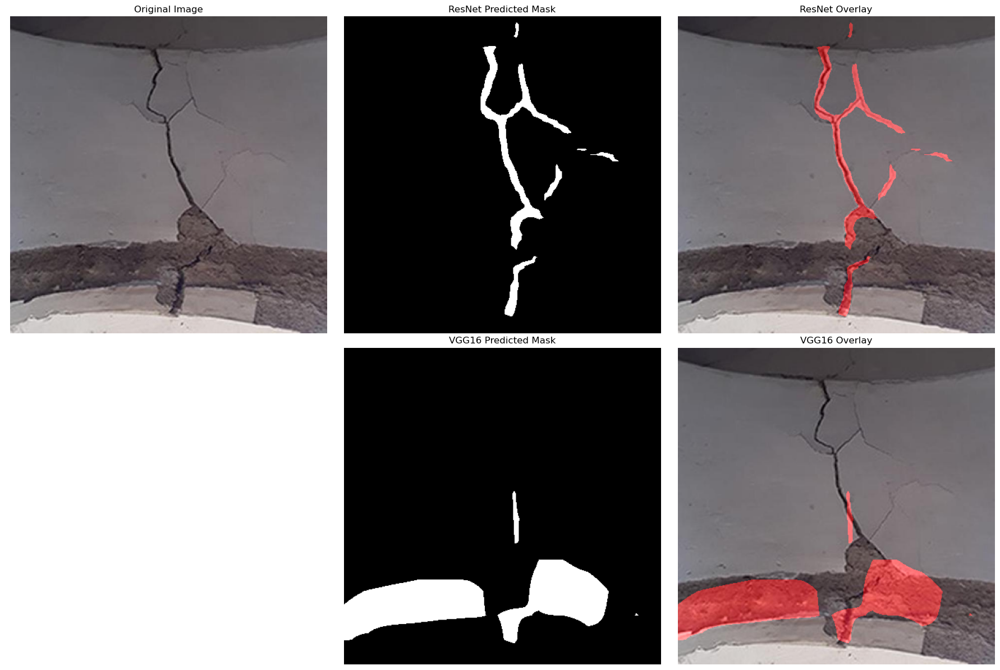

In [42]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms, models
import torch.nn.functional as F
import cv2
from torch import nn

# Define image path
unseen_image_path = '20210506_164816_jpg.rf.48a151ca187d4da0cfa4ce228477c9a7.jpg'

# Image dimensions
H = 448
W = 448

# Define the same normalization as used during training
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Define the transformation pipeline
preprocess = transforms.Compose([
    transforms.Resize((H, W)),
    transforms.ToTensor(),
    normalize
])

# Function to load and preprocess the image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image)
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Define the models
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

def create_resnet_model(num_classes=2):
    # Load pretrained weights
    weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
    model = deeplabv3_resnet50(weights=weights, progress=True)
    # Replace the classifier for 2 classes (ground, crack)
    model.classifier = DeepLabHead(2048, num_classes)
    return model

# VGG16 model for segmentation
class VGG16Segmentation(nn.Module):
    def __init__(self, num_classes):
        super(VGG16Segmentation, self).__init__()
        vgg = models.vgg16(pretrained=True)
        self.features = vgg.features
        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)

    def forward(self, x):
        x = self.features(x)
        x = self.final_conv(x)
        x = F.interpolate(x, size=(H, W), mode='bilinear', align_corners=True)
        return x

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Paths to weights
resnet_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/res_net_best_weight.pth'
vgg16_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/vgg16_origin_best_weight.pth'

# Load ResNet model
resnet_model = create_resnet_model(num_classes=2)
try:
    resnet_state_dict = torch.load(resnet_weights_path, map_location=device)
    resnet_model.load_state_dict(resnet_state_dict)
    resnet_model.to(device)
    resnet_model.eval()
    print("ResNet model loaded and moved to device successfully.")
except Exception as e:
    print(f"Error loading ResNet model: {e}")

# Load VGG16 model
vgg16_model = VGG16Segmentation(num_classes=2)
try:
    vgg16_state_dict = torch.load(vgg16_weights_path, map_location=device)
    vgg16_model.load_state_dict(vgg16_state_dict)
    vgg16_model.to(device)
    vgg16_model.eval()
    print("VGG16 model loaded and moved to device successfully.")
except Exception as e:
    print(f"Error loading VGG16 model: {e}")

# Verification function
def verify_model_device(model, device):
    for name, param in model.named_parameters():
        if param.device != device:
            print(f"Parameter '{name}' is on {param.device}, expected {device}")
            return False
    print(f"All model parameters are on {device}.")
    return True

# Verify ResNet model
verify_model_device(resnet_model, device)

# Verify VGG16 model
verify_model_device(vgg16_model, device)

# Load the image
input_image = load_image(unseen_image_path).to(device)
print(f"Input image tensor is on device: {input_image.device}")

# Function to perform prediction
def predict(model, image):
    model.eval()
    with torch.no_grad():
        output = model(image)
        if isinstance(output, dict) and 'out' in output:
            output = output['out']
        # If the model is DeepLabV3 or similar, output might be larger; resize if necessary
        output = F.interpolate(output, size=(H, W), mode='bilinear', align_corners=True)
        preds = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
    return preds

# Perform predictions
try:
    resnet_pred = predict(resnet_model, input_image)
    print("ResNet prediction completed successfully.")
except Exception as e:
    print(f"Error during ResNet prediction: {e}")

try:
    vgg16_pred = predict(vgg16_model, input_image)
    print("VGG16 prediction completed successfully.")
except Exception as e:
    print(f"Error during VGG16 prediction: {e}")

# Function to visualize the results
def visualize_prediction(image_path, resnet_mask, vgg16_mask):
    # Load original image for visualization
    original = cv2.imread(image_path)
    if original is None:
        print(f"Error: Unable to load image at path '{image_path}'.")
        return
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    original = cv2.resize(original, (W, H))

    # Create a color map for masks
    color_map = {0: (0, 0, 0),      # Background - Black
                1: (255, 0, 0)}    # Crack - Red

    def apply_color_mask(mask):
        colored_mask = np.zeros((H, W, 3), dtype=np.uint8)
        for class_idx, color in color_map.items():
            colored_mask[mask == class_idx] = color
        return colored_mask

    resnet_mask_colored = apply_color_mask(resnet_mask)
    vgg16_mask_colored = apply_color_mask(vgg16_mask)

    # Overlay masks on the original image
    alpha = 0.5
    resnet_overlay = cv2.addWeighted(original, 1, resnet_mask_colored, alpha, 0)
    vgg16_overlay = cv2.addWeighted(original, 1, vgg16_mask_colored, alpha, 0)

    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(18, 12))

    # Original Image
    axs[0, 0].imshow(original)
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # ResNet Prediction
    axs[0, 1].imshow(resnet_mask, cmap='gray')
    axs[0, 1].set_title('ResNet Predicted Mask')
    axs[0, 1].axis('off')

    # ResNet Overlay
    axs[0, 2].imshow(resnet_overlay)
    axs[0, 2].set_title('ResNet Overlay')
    axs[0, 2].axis('off')

    # VGG16 Prediction
    axs[1, 1].imshow(vgg16_mask, cmap='gray')
    axs[1, 1].set_title('VGG16 Predicted Mask')
    axs[1, 1].axis('off')

    # VGG16 Overlay
    axs[1, 2].imshow(vgg16_overlay)
    axs[1, 2].set_title('VGG16 Overlay')
    axs[1, 2].axis('off')

    # Hide the unused subplot
    axs[1, 0].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the predictions
visualize_prediction(unseen_image_path, resnet_pred, vgg16_pred)




Using device: cuda


/tmp/ipykernel_17/1443236177.py:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet_state_dict = torch.load(resnet_weights_path, map_location=device)


ResNet model loaded and moved to device successfully.


/tmp/ipykernel_17/1443236177.py:84: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vgg16_state_dict = torch.load(vgg16_weights_path, map_location=device)


VGG16 model loaded and moved to device successfully.
Parameter 'backbone.conv1.weight' is on cuda:0, expected cuda
Parameter 'features.0.weight' is on cuda:0, expected cuda
Input image tensor is on device: cuda:0
ResNet prediction completed successfully.
VGG16 prediction completed successfully.


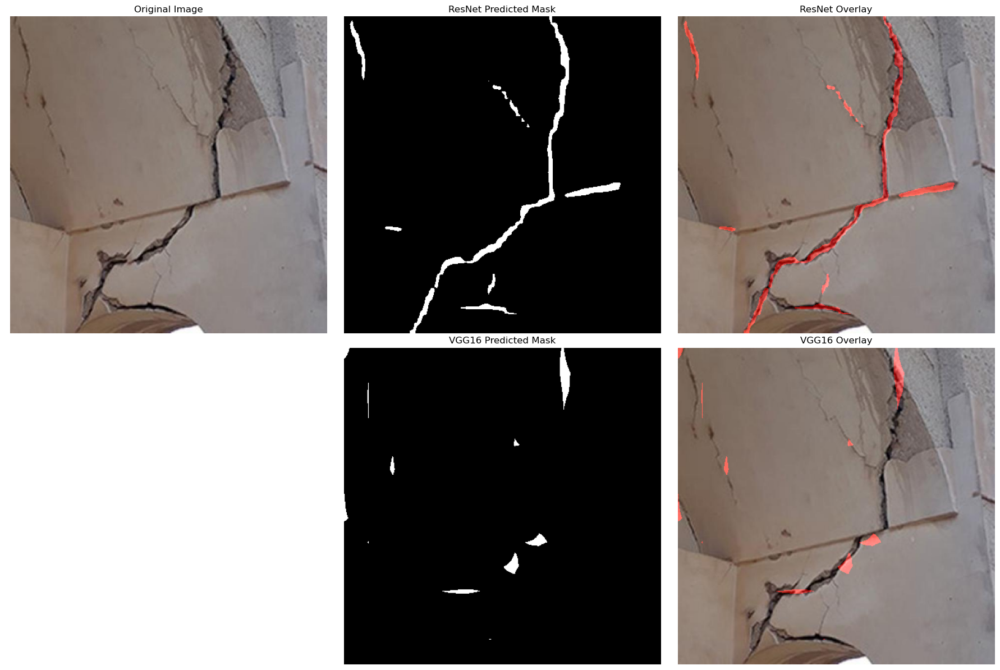

In [43]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms, models
import torch.nn.functional as F
import cv2
from torch import nn

# Define image path
unseen_image_path = '20210506_1633371_jpg.rf.f7df9d161007e83b1e89afc395d66e23.jpg'

# Image dimensions
H = 448
W = 448

# Define the same normalization as used during training
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Define the transformation pipeline
preprocess = transforms.Compose([
    transforms.Resize((H, W)),
    transforms.ToTensor(),
    normalize
])

# Function to load and preprocess the image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image)
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Define the models
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

def create_resnet_model(num_classes=2):
    # Load pretrained weights
    weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
    model = deeplabv3_resnet50(weights=weights, progress=True)
    # Replace the classifier for 2 classes (ground, crack)
    model.classifier = DeepLabHead(2048, num_classes)
    return model

# VGG16 model for segmentation
class VGG16Segmentation(nn.Module):
    def __init__(self, num_classes):
        super(VGG16Segmentation, self).__init__()
        vgg = models.vgg16(pretrained=True)
        self.features = vgg.features
        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)

    def forward(self, x):
        x = self.features(x)
        x = self.final_conv(x)
        x = F.interpolate(x, size=(H, W), mode='bilinear', align_corners=True)
        return x

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Paths to weights
resnet_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/res_net_best_weight.pth'
vgg16_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/vgg16_origin_best_weight.pth'

# Load ResNet model
resnet_model = create_resnet_model(num_classes=2)
try:
    resnet_state_dict = torch.load(resnet_weights_path, map_location=device)
    resnet_model.load_state_dict(resnet_state_dict)
    resnet_model.to(device)
    resnet_model.eval()
    print("ResNet model loaded and moved to device successfully.")
except Exception as e:
    print(f"Error loading ResNet model: {e}")

# Load VGG16 model
vgg16_model = VGG16Segmentation(num_classes=2)
try:
    vgg16_state_dict = torch.load(vgg16_weights_path, map_location=device)
    vgg16_model.load_state_dict(vgg16_state_dict)
    vgg16_model.to(device)
    vgg16_model.eval()
    print("VGG16 model loaded and moved to device successfully.")
except Exception as e:
    print(f"Error loading VGG16 model: {e}")

# Verification function
def verify_model_device(model, device):
    for name, param in model.named_parameters():
        if param.device != device:
            print(f"Parameter '{name}' is on {param.device}, expected {device}")
            return False
    print(f"All model parameters are on {device}.")
    return True

# Verify ResNet model
verify_model_device(resnet_model, device)

# Verify VGG16 model
verify_model_device(vgg16_model, device)

# Load the image
input_image = load_image(unseen_image_path).to(device)
print(f"Input image tensor is on device: {input_image.device}")

# Function to perform prediction
def predict(model, image):
    model.eval()
    with torch.no_grad():
        output = model(image)
        if isinstance(output, dict) and 'out' in output:
            output = output['out']
        # If the model is DeepLabV3 or similar, output might be larger; resize if necessary
        output = F.interpolate(output, size=(H, W), mode='bilinear', align_corners=True)
        preds = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
    return preds

# Perform predictions
try:
    resnet_pred = predict(resnet_model, input_image)
    print("ResNet prediction completed successfully.")
except Exception as e:
    print(f"Error during ResNet prediction: {e}")

try:
    vgg16_pred = predict(vgg16_model, input_image)
    print("VGG16 prediction completed successfully.")
except Exception as e:
    print(f"Error during VGG16 prediction: {e}")

# Function to visualize the results
def visualize_prediction(image_path, resnet_mask, vgg16_mask):
    # Load original image for visualization
    original = cv2.imread(image_path)
    if original is None:
        print(f"Error: Unable to load image at path '{image_path}'.")
        return
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    original = cv2.resize(original, (W, H))

    # Create a color map for masks
    color_map = {0: (0, 0, 0),      # Background - Black
                1: (255, 0, 0)}    # Crack - Red

    def apply_color_mask(mask):
        colored_mask = np.zeros((H, W, 3), dtype=np.uint8)
        for class_idx, color in color_map.items():
            colored_mask[mask == class_idx] = color
        return colored_mask

    resnet_mask_colored = apply_color_mask(resnet_mask)
    vgg16_mask_colored = apply_color_mask(vgg16_mask)

    # Overlay masks on the original image
    alpha = 0.5
    resnet_overlay = cv2.addWeighted(original, 1, resnet_mask_colored, alpha, 0)
    vgg16_overlay = cv2.addWeighted(original, 1, vgg16_mask_colored, alpha, 0)

    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(18, 12))

    # Original Image
    axs[0, 0].imshow(original)
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # ResNet Prediction
    axs[0, 1].imshow(resnet_mask, cmap='gray')
    axs[0, 1].set_title('ResNet Predicted Mask')
    axs[0, 1].axis('off')

    # ResNet Overlay
    axs[0, 2].imshow(resnet_overlay)
    axs[0, 2].set_title('ResNet Overlay')
    axs[0, 2].axis('off')

    # VGG16 Prediction
    axs[1, 1].imshow(vgg16_mask, cmap='gray')
    axs[1, 1].set_title('VGG16 Predicted Mask')
    axs[1, 1].axis('off')

    # VGG16 Overlay
    axs[1, 2].imshow(vgg16_overlay)
    axs[1, 2].set_title('VGG16 Overlay')
    axs[1, 2].axis('off')

    # Hide the unused subplot
    axs[1, 0].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the predictions
visualize_prediction(unseen_image_path, resnet_pred, vgg16_pred)

## Evaluating All Models

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, models
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from torchvision.models.segmentation.deeplabv3 import DeepLabHead
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import cv2
from collections import namedtuple
import matplotlib.colors as colors
from sklearn.metrics import jaccard_score, precision_score, recall_score, f1_score
from torch.utils.data import Dataset, DataLoader
import os
import glob
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report
from sklearn.metrics import jaccard_score
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [3]:

# Suppress irrelevant warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the label colormap
Label = namedtuple('Label', ['name', 'id', 'color'])
labels = [
    Label('ground', 0, (0, 0, 0)),
    Label('crack', 1, (255, 255, 255))
]
max_label_id = max([l.id for l in labels])
LabelCmap = colors.ListedColormap([np.array(l.color) / 255 for l in labels])
bounds = np.linspace(0, max_label_id + 1, max_label_id + 2)

# Define data transformations
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
data_transforms = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
    normalize
])

class CrackDataset(Dataset):
    def __init__(self, images_list, masks_list, transform=None):
        self.images_list = images_list
        self.masks_list = masks_list
        self.transform = transform

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, idx):
        img_path = self.images_list[idx]
        mask_path = self.masks_list[idx]

        image = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')

        if self.transform:
            image = self.transform(image)

        mask = mask.resize((448, 448))
        mask = np.array(mask)
        mask = (mask >= 128).astype(np.uint8)

        return image, torch.from_numpy(mask).long()



In [4]:
# Function to load test data
def load_test_data(test_dir):
    images = sorted(glob.glob(os.path.join(test_dir, 'images', '*')))
    masks = sorted(glob.glob(os.path.join(test_dir, 'masks', '*')))
    return images, masks

test_dir = 'extracted_dataset/crack_segmentation_dataset/test'  
test_images, test_masks = load_test_data(test_dir)

# Create test dataset and dataloader
test_dataset = CrackDataset(test_images, test_masks, transform=data_transforms)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)


In [5]:
# UNet model definitions matching training code
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super(DoubleConv, self).__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )
    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            # Use transposed convolution for upsampling
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1, x2):
        x1 = self.up(x1)

        # Padding in case the incoming volumes are of different sizes
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):  # Set bilinear=True
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        factor = 2 if bilinear else 1

        self.inc = DoubleConv(n_channels, 64)
        self.down_64_to_128 = Down(64, 128)
        self.down_128_to_256 = Down(128, 256)
        self.down_256_to_512 = Down(256, 512)
        self.down_512_to_1024 = Down(512, 1024 // factor)
        self.up_1024_to_512 = Up(1024, 512 // factor, bilinear)
        self.up_512_to_256 = Up(512, 256 // factor, bilinear)
        self.up_256_to_128 = Up(256, 128 // factor, bilinear)
        self.up_128_to_64 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)
    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down_64_to_128(x1)
        x3 = self.down_128_to_256(x2)
        x4 = self.down_256_to_512(x3)
        x5 = self.down_512_to_1024(x4)
        x = self.up_1024_to_512(x5, x4)
        x = self.up_512_to_256(x, x3)
        x = self.up_256_to_128(x, x2)
        x = self.up_128_to_64(x, x1)
        logits = self.outc(x)
        return logits

# ResNet-based DeepLabV3 model
def custom_DeepLabv3():
    weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
    model = deeplabv3_resnet50(weights=weights, progress=True)
    model.classifier = DeepLabHead(2048, 2)
    return model
'''
# VGG16-based model
class VGG16Segmentation(nn.Module):
    def __init__(self, num_classes):
        super(VGG16Segmentation, self).__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        self.features = vgg.features
        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)
    def forward(self, x):
        x = self.features(x)
        x = self.final_conv(x)
        x = nn.functional.interpolate(x, size=(448, 448), mode='bilinear', align_corners=True)
        return x
'''
class VGG16Segmentation(nn.Module):
    def __init__(self, num_classes):
        super(VGG16Segmentation, self).__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        self.features = vgg.features
        self.final_conv = nn.Conv2d(512, num_classes, kernel_size=1)
        
    def forward(self, x):
        input_size = x.size()  # (N, C, H, W)
        x = self.features(x)
        x = self.final_conv(x)
        x = nn.functional.interpolate(x, size=(input_size[2], input_size[3]), mode='bilinear', align_corners=True)
        return x

# Instantiate models
unet_model = UNet(n_channels=3, n_classes=2, bilinear=True).to(device)
resnet_model = custom_DeepLabv3().to(device)
vgg16_model = VGG16Segmentation(num_classes=2).to(device)

# Load weights
unet_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/unet_bilinear_best_weight.pth'
resnet_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/res_net_best_weight.pth'
vgg16_weights_path = 'extracted_dataset/crack_segmentation_dataset/weights/vgg16_origin_best_weight.pth'

unet_model.load_state_dict(torch.load(unet_weights_path, map_location=device), strict=True)
resnet_model.load_state_dict(torch.load(resnet_weights_path, map_location=device), strict=True)
vgg16_model.load_state_dict(torch.load(vgg16_weights_path, map_location=device), strict=True)

# Set models to evaluation mode
#unet_model.eval()
#resnet_model.eval()
vgg16_model.eval()




/tmp/ipykernel_629/1394152147.py:138: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  unet_model.load_state_dict(torch.load(unet_weights_path, map_location=device), strict=Tru

VGG16Segmentation(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding

In [6]:
#1
def evaluate_model(model, data_loader, model_name):
    total_iou = 0.0
    total_mpa = 0.0
    total_precision = 0.0
    total_recall = 0.0
    total_f1 = 0.0
    total_samples = 0

    model.eval()  # Ensure the model is in evaluation mode

    with torch.no_grad():
        # Initialize the progress bar
        loop = tqdm(enumerate(data_loader), total=len(data_loader), desc=f"Evaluating {model_name}", leave=False)
        for idx, (images, labels) in loop:
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            if model_name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)

            preds = torch.argmax(outputs, dim=1)

            # Flatten tensors
            preds_flat = preds.view(-1).cpu().numpy()
            labels_flat = labels.view(-1).cpu().numpy()

            # Compute metrics
            iou = jaccard_score(labels_flat, preds_flat, average='binary', zero_division=0)
            mpa = (preds_flat == labels_flat).sum() / len(labels_flat)
            precision = precision_score(labels_flat, preds_flat, zero_division=0)
            recall = recall_score(labels_flat, preds_flat, zero_division=0)
            f1 = f1_score(labels_flat, preds_flat, zero_division=0)

            total_iou += iou
            total_mpa += mpa
            total_precision += precision
            total_recall += recall
            total_f1 += f1
            total_samples += 1

            # Update progress bar with the latest metrics
            loop.set_postfix({
                'Batch': f"{idx + 1}/{len(data_loader)}",
                'IoU': f"{iou:.4f}",
                'mPA': f"{mpa:.4f}",
                'F1': f"{f1:.4f}"
            })

    avg_iou = total_iou / total_samples
    avg_mpa = total_mpa / total_samples
    avg_precision = total_precision / total_samples
    avg_recall = total_recall / total_samples
    avg_f1 = total_f1 / total_samples

    metrics = {
        'IoU': avg_iou,
        'mPA': avg_mpa,
        'Precision': avg_precision,
        'Recall': avg_recall,
        'F1-Score': avg_f1
    }

    return metrics





In [7]:
def evaluate_model_per_class(model, data_loader, model_name, num_classes=2):
    # Initialize counters
    true_positives = np.zeros(num_classes)
    false_positives = np.zeros(num_classes)
    false_negatives = np.zeros(num_classes)
    total_correct = 0
    total_pixels = 0

    model.eval()
    with torch.no_grad():
        loop = tqdm(data_loader, desc=f"Evaluating {model_name} per class")
        for images, labels in loop:
            images = images.to(device)
            labels = labels.to(device)

            if model_name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)

            preds = torch.argmax(outputs, dim=1)

            for cls in range(num_classes):
                cls_mask = (labels == cls)
                cls_preds = (preds == cls)

                true_positives[cls] += (cls_preds & cls_mask).sum().item()
                false_positives[cls] += (cls_preds & ~cls_mask).sum().item()
                false_negatives[cls] += (~cls_preds & cls_mask).sum().item()

            total_correct += (preds == labels).sum().item()
            total_pixels += torch.numel(labels)

    # Compute per-class precision, recall, and F1-score
    precision_per_class = true_positives / (true_positives + false_positives + 1e-7)
    recall_per_class = true_positives / (true_positives + false_negatives + 1e-7)
    f1_per_class = 2 * (precision_per_class * recall_per_class) / (precision_per_class + recall_per_class + 1e-7)

    # Compute overall accuracy
    pixel_accuracy = total_correct / total_pixels

    # Prepare metrics dictionary
    metrics = {
        'Precision per Class': precision_per_class,
        'Recall per Class': recall_per_class,
        'F1-Score per Class': f1_per_class,
        'Pixel Accuracy': pixel_accuracy
    }

    return metrics


In [13]:
def compute_confusion_matrix_incremental(model, data_loader, model_name, num_classes=2):
    cm = np.zeros((num_classes, num_classes), dtype=int)

    model.eval()
    with torch.no_grad():
        loop = tqdm(data_loader, desc=f"Computing Confusion Matrix for {model_name}")
        for images, labels in loop:
            images = images.to(device)
            labels = labels.cpu().numpy()

            if model_name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)

            preds = torch.argmax(outputs, dim=1).cpu().numpy()

            # Flatten predictions and labels
            preds_flat = preds.flatten()
            labels_flat = labels.flatten()

            # Update confusion matrix
            cm += confusion_matrix(labels_flat, preds_flat, labels=list(range(num_classes)))

    return cm


In [9]:
def plot_training_curves(train_history, val_history, metric_name):
    epochs = range(1, len(train_history) + 1)
    plt.figure(figsize=(8, 6))
    plt.plot(epochs, train_history, 'b-', label=f'Training {metric_name}')
    plt.plot(epochs, val_history, 'r-', label=f'Validation {metric_name}')
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel(metric_name, fontsize=12)
    plt.title(f'{metric_name} Over Epochs', fontsize=16)
    plt.legend()
    plt.grid(True)
    plt.show()



In [10]:
def evaluate_model_pixel_accuracy(model, data_loader, model_name):
    total_correct = 0
    total_pixels = 0

    model.eval()
    with torch.no_grad():
        loop = tqdm(data_loader, desc=f"Evaluating {model_name} Pixel Accuracy")
        for images, labels in loop:
            images = images.to(device)
            labels = labels.to(device)

            if model_name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)

            preds = torch.argmax(outputs, dim=1)

            total_correct += (preds == labels).sum().item()
            total_pixels += torch.numel(labels)

    pixel_accuracy = total_correct / total_pixels
    print(f"{model_name} Pixel Accuracy: {pixel_accuracy:.4f}")



Evaluating UNet...



Evaluating UNet per class: 100%|██████████| 1695/1695 [01:30<00:00, 18.66it/s]


UNet Per-Class Metrics:
  Precision per Class (Class 0): 0.9840
  Precision per Class (Class 1): 0.6484
  Recall per Class (Class 0): 0.9890
  Recall per Class (Class 1): 0.5583
  F1-Score per Class (Class 0): 0.9865
  F1-Score per Class (Class 1): 0.6000
  Pixel Accuracy: 0.9739


Computing Confusion Matrix for UNet: 100%|██████████| 1695/1695 [02:26<00:00, 11.58it/s]


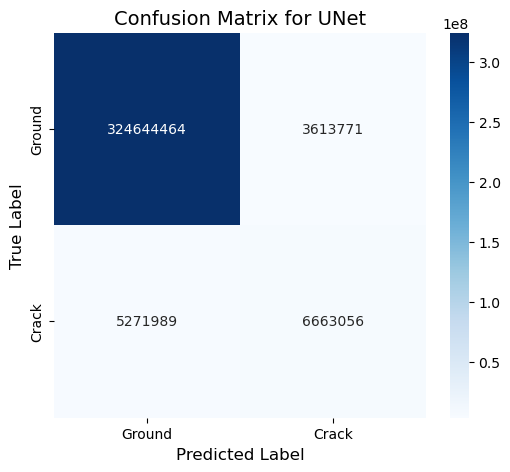

Evaluating UNet Pixel Accuracy: 100%|██████████| 1695/1695 [01:30<00:00, 18.73it/s]


UNet Pixel Accuracy: 0.9739

Evaluating ResNet50...



Evaluating ResNet50 per class: 100%|██████████| 1695/1695 [02:17<00:00, 12.34it/s]


ResNet50 Per-Class Metrics:
  Precision per Class (Class 0): 0.9902
  Precision per Class (Class 1): 0.7969
  Recall per Class (Class 0): 0.9932
  Recall per Class (Class 1): 0.7291
  F1-Score per Class (Class 0): 0.9917
  F1-Score per Class (Class 1): 0.7615
  Pixel Accuracy: 0.9840


Computing Confusion Matrix for ResNet50: 100%|██████████| 1695/1695 [03:08<00:00,  9.00it/s]


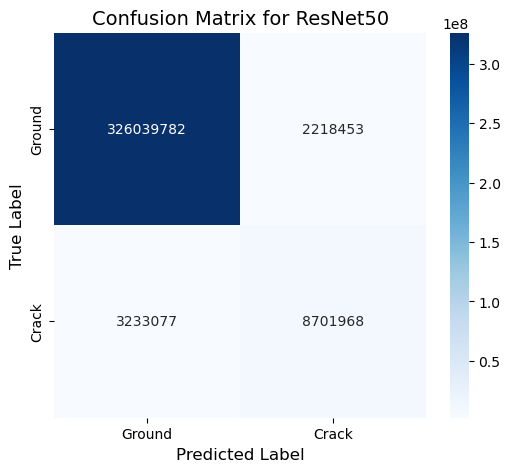

Evaluating ResNet50 Pixel Accuracy: 100%|██████████| 1695/1695 [02:17<00:00, 12.34it/s]


ResNet50 Pixel Accuracy: 0.9840

Evaluating VGG16...



Evaluating VGG16 per class: 100%|██████████| 1695/1695 [00:49<00:00, 33.99it/s]


VGG16 Per-Class Metrics:
  Precision per Class (Class 0): 0.9791
  Precision per Class (Class 1): 0.7061
  Recall per Class (Class 0): 0.9937
  Recall per Class (Class 1): 0.4173
  F1-Score per Class (Class 0): 0.9864
  F1-Score per Class (Class 1): 0.5246
  Pixel Accuracy: 0.9735


Computing Confusion Matrix for VGG16: 100%|██████████| 1695/1695 [01:55<00:00, 14.69it/s]


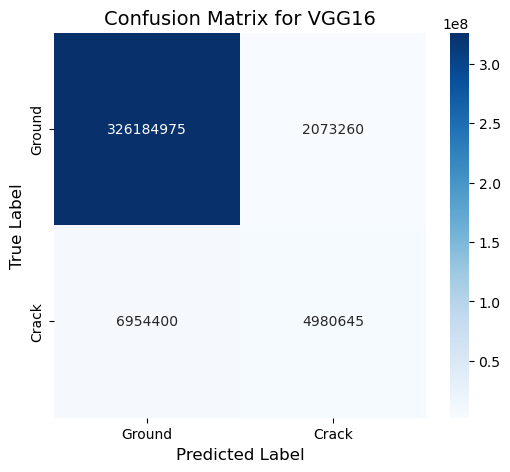

Evaluating VGG16 Pixel Accuracy: 100%|██████████| 1695/1695 [00:49<00:00, 34.43it/s]


VGG16 Pixel Accuracy: 0.9735


In [14]:
# Define models_dict as before
models_dict = {
    'UNet': unet_model,
    'ResNet50': resnet_model,
    'VGG16': vgg16_model
}

# Evaluate each model
for model_name, model in models_dict.items():
    print(f"\nEvaluating {model_name}...\n")
    # Per-Class Metrics
    metrics = evaluate_model_per_class(model, test_loader, model_name)
    print(f"{model_name} Per-Class Metrics:")
    for metric_name, values in metrics.items():
        if isinstance(values, np.ndarray):
            for cls_idx, value in enumerate(values):
                print(f"  {metric_name} (Class {cls_idx}): {value:.4f}")
        else:
            print(f"  {metric_name}: {values:.4f}")
    # Confusion Matrix
    cm = compute_confusion_matrix_incremental(model, test_loader, model_name)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Ground', 'Crack'], yticklabels=['Ground', 'Crack'])
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.title(f'Confusion Matrix for {model_name}', fontsize=14)
    plt.show()
    # Pixel Accuracy
    evaluate_model_pixel_accuracy(model, test_loader, model_name)


In [16]:
# Evaluate models and collect per-class metrics
for model_name, model in models_dict.items():
    metrics = evaluate_model_per_class(model, test_loader, model_name)
    print(f"{model_name} Metrics:")
    for metric_name, values in metrics.items():
        if isinstance(values, np.ndarray):
            for cls_idx, value in enumerate(values):
                print(f"  {metric_name} (Class {cls_idx}): {value:.4f}")
        else:
            print(f"  {metric_name}: {values:.4f}")
    print()


Evaluating UNet per class: 100%|██████████| 1695/1695 [01:30<00:00, 18.66it/s]


UNet Metrics:
  Precision per Class (Class 0): 0.9840
  Precision per Class (Class 1): 0.6484
  Recall per Class (Class 0): 0.9890
  Recall per Class (Class 1): 0.5583
  F1-Score per Class (Class 0): 0.9865
  F1-Score per Class (Class 1): 0.6000
  Pixel Accuracy: 0.9739



Evaluating ResNet50 per class: 100%|██████████| 1695/1695 [02:17<00:00, 12.33it/s]


ResNet50 Metrics:
  Precision per Class (Class 0): 0.9902
  Precision per Class (Class 1): 0.7969
  Recall per Class (Class 0): 0.9932
  Recall per Class (Class 1): 0.7291
  F1-Score per Class (Class 0): 0.9917
  F1-Score per Class (Class 1): 0.7615
  Pixel Accuracy: 0.9840



Evaluating VGG16 per class: 100%|██████████| 1695/1695 [00:50<00:00, 33.38it/s]

VGG16 Metrics:
  Precision per Class (Class 0): 0.9791
  Precision per Class (Class 1): 0.7061
  Recall per Class (Class 0): 0.9937
  Recall per Class (Class 1): 0.4173
  F1-Score per Class (Class 0): 0.9864
  F1-Score per Class (Class 1): 0.5246
  Pixel Accuracy: 0.9735



Evaluating VGG16 per class: 100%|██████████| 1695/1695 [00:50<00:00, 33.48it/s]


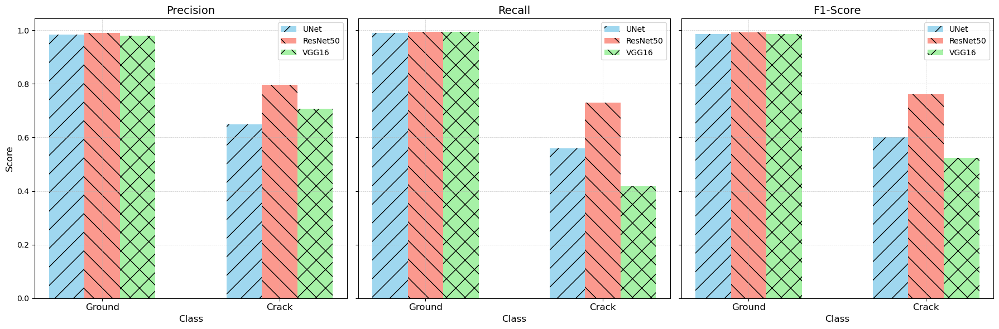

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def plot_per_class_metrics(models_metrics, class_names):
    metrics = ['Precision', 'Recall', 'F1-Score']
    num_classes = len(class_names)
    num_metrics = len(metrics)
    num_models = len(models_metrics)

    # Prepare data for plotting
    index = np.arange(num_classes)
    bar_width = 0.2  # Adjust as needed
    opacity = 0.8

    colors = ['skyblue', 'salmon', 'lightgreen']
    hatch_patterns = ['/', '\\', 'x']

    fig, axes = plt.subplots(1, num_metrics, figsize=(6 * num_metrics, 6), sharey=True)

    for m_idx, metric_name in enumerate(metrics):
        ax = axes[m_idx]
        for i, (model_name, metrics_dict) in enumerate(models_metrics.items()):
            values = metrics_dict[f'{metric_name} per Class']
            bars = ax.bar(index + i * bar_width, values, bar_width,
                          alpha=opacity, label=model_name,
                          color=colors[i % len(colors)],
                          hatch=hatch_patterns[i % len(hatch_patterns)])

        ax.set_xlabel('Class', fontsize=12)
        if m_idx == 0:
            ax.set_ylabel('Score', fontsize=12)
        ax.set_title(metric_name, fontsize=14)
        ax.set_xticks(index + bar_width * (num_models - 1) / 2)
        ax.set_xticklabels(class_names, fontsize=12)
        ax.legend(fontsize=10)
        ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    plt.tight_layout()
    plt.show()

# Collect per-class metrics for all models
models_metrics = {}
for model_name, model in models_dict.items():
    metrics = evaluate_model_per_class(model, test_loader, model_name)
    models_metrics[model_name] = metrics

# Class names (adjust as needed)
class_names = ['Ground', 'Crack']

# Plot the per-class metrics
plot_per_class_metrics(models_metrics, class_names)


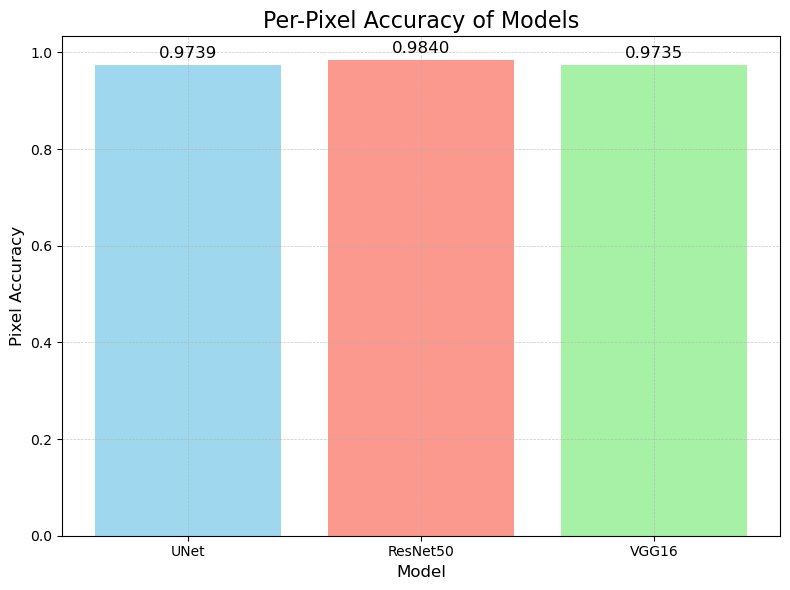

In [18]:
def plot_pixel_accuracy(models_metrics):
    model_names = list(models_metrics.keys())
    accuracies = [metrics['Pixel Accuracy'] for metrics in models_metrics.values()]

    fig, ax = plt.subplots(figsize=(8, 6))
    bars = ax.bar(model_names, accuracies, color=['skyblue', 'salmon', 'lightgreen'], alpha=0.8)

    # Add value labels on top of each bar
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # Vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=12)

    ax.set_xlabel('Model', fontsize=12)
    ax.set_ylabel('Pixel Accuracy', fontsize=12)
    ax.set_title('Per-Pixel Accuracy of Models', fontsize=16)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

    plt.tight_layout()
    plt.show()

# Plot the per-pixel accuracy
plot_pixel_accuracy(models_metrics)


In [19]:
# Evaluate UNet
print("Evaluating UNet...")
unet_metrics = evaluate_model(unet_model, test_loader, model_name='UNet')
print(f"UNet Metrics: {unet_metrics}\n")

# Evaluate ResNet50
print("Evaluating ResNet50...")
resnet_metrics = evaluate_model(resnet_model, test_loader, model_name='ResNet50')
print(f"ResNet50 Metrics: {resnet_metrics}\n")

# Evaluate VGG16
print("Evaluating VGG16...")
vgg16_metrics = evaluate_model(vgg16_model, test_loader, model_name='VGG16')
print(f"VGG16 Metrics: {vgg16_metrics}\n")



Evaluating UNet...


UNet Metrics: {'IoU': 0.34902933848314066, 'mPA': 0.9738802600686284, 'Precision': 0.6119511705683388, 'Recall': 0.43896901685255674, 'F1-Score': 0.4683964506503389}

Evaluating ResNet50...


ResNet50 Metrics: {'IoU': 0.4787516223904977, 'mPA': 0.9839751978639921, 'Precision': 0.6380164088984095, 'Recall': 0.5970139680237081, 'F1-Score': 0.5996317261670647}

Evaluating VGG16...


VGG16 Metrics: {'IoU': 0.1983453180435539, 'mPA': 0.9734631442455314, 'Precision': 0.44895731523444105, 'Recall': 0.24314173919346435, 'F1-Score': 0.2811823262810055}



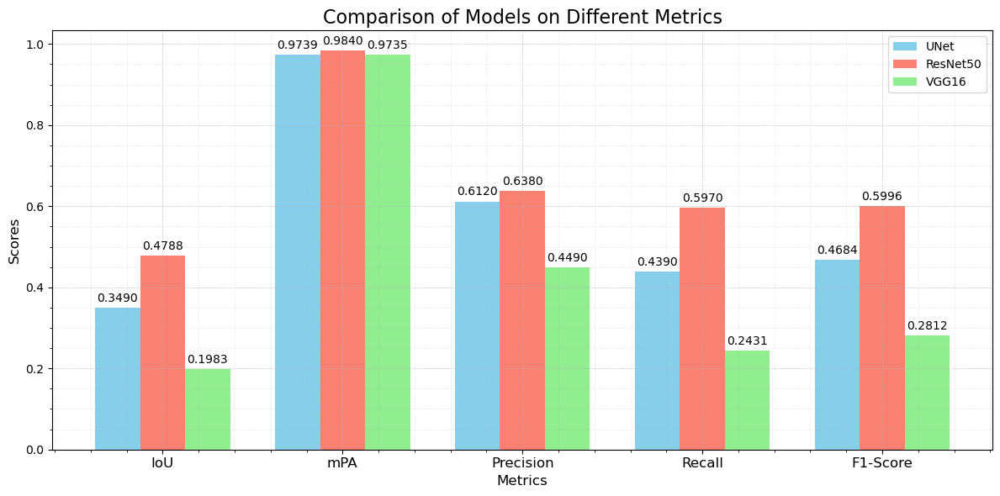

In [20]:
# Collect all metrics
models = ['UNet', 'ResNet50', 'VGG16']
metrics = ['IoU', 'mPA', 'Precision', 'Recall', 'F1-Score']

metrics_data = {
    'UNet': unet_metrics,
    'ResNet50': resnet_metrics,
    'VGG16': vgg16_metrics
}

def plot_metrics_comparison(metrics_data, metrics):
    n_metrics = len(metrics)
    n_models = len(models)
    index = np.arange(n_metrics)
    bar_width = 0.25

    # Colors for each model
    colors = ['skyblue', 'salmon', 'lightgreen']

    fig, ax = plt.subplots(figsize=(12, 6))

    for i, model in enumerate(models):
        values = [metrics_data[model][metric] for metric in metrics]
        bars = ax.bar(index + i * bar_width, values, bar_width, label=model, color=colors[i])

        # Add value labels on top of each bar
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.4f}',  # Adjust decimal places as needed
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # Vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=10)

    ax.set_xlabel('Metrics', fontsize=12)
    ax.set_ylabel('Scores', fontsize=12)
    ax.set_title('Comparison of Models on Different Metrics', fontsize=16)
    ax.set_xticks(index + bar_width)
    ax.set_xticklabels(metrics, fontsize=12)
    ax.legend()
    ax.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.5)

    # Enable minor ticks
    ax.minorticks_on()

    plt.tight_layout()
    plt.show()


plot_metrics_comparison(metrics_data, metrics)


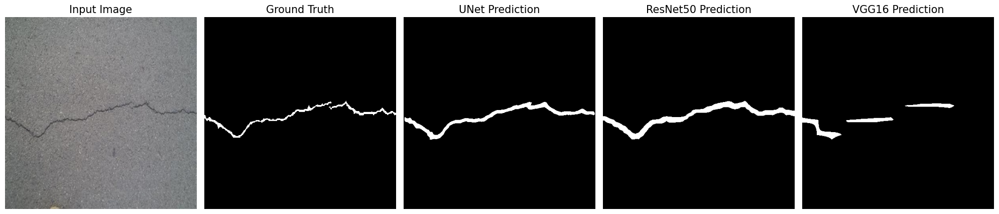

In [23]:
'''
# Function to display sample predictions
def visualize_predictions(models_dict, data_loader):
    data_iter = iter(data_loader)
    images, labels = next(data_iter)
    images = images.to(device)
    labels = labels.squeeze(0).cpu().numpy()

    # Get model predictions
    predictions = {}
    for name, model in models_dict.items():
        with torch.no_grad():
            if name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            predictions[name] = preds.squeeze(0).cpu().numpy()

    image_np = images.squeeze(0).permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * np.array([0.229, 0.224, 0.225]) + 
                np.array([0.485, 0.456, 0.406]))
    image_np = np.clip(image_np, 0, 1)

    display_list = [image_np, labels] + list(predictions.values())
    titles = ['Input Image', 'Ground Truth'] + [f"{name} Prediction" for name in models_dict.keys()]

    display(display_list, titles)
'''
def visualize_predictions(models_dict, data_loader):
    data_iter = iter(data_loader)
    images, labels = next(data_iter)
    images = images.to(device)
    labels = labels.squeeze(0).cpu().numpy()
    
    # Denormalize the input image for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    image_np = images.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    image_np = std * image_np + mean
    image_np = np.clip(image_np, 0, 1)
    
    # Get model predictions
    predictions = {}
    for name, model in models_dict.items():
        model.eval()
        with torch.no_grad():
            if name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            predictions[name] = preds.squeeze(0).cpu().numpy()
    
    display_list = [image_np, labels] + list(predictions.values())
    titles = ['Input Image', 'Ground Truth'] + [f"{name} Prediction" for name in models_dict.keys()]
    
    display(display_list, titles)

    
# Models dictionary
models_dict = {
    'UNet': unet_model,
    'ResNet50': resnet_model,
    'VGG16': vgg16_model
}

# Visualize predictions
visualize_predictions(models_dict, test_loader)



In [ ]:
def visualize_predictions(models_dict, data_loader, num_samples=5):
    data_iter = iter(data_loader)
    for _ in range(num_samples):
        images, labels = next(data_iter)
        # Existing visualization code...

    images, labels = next(data_iter)
    images = images.to(device)
    labels_np = labels.squeeze(0).cpu().numpy()
    
    # Denormalize the input image for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    image_np = images.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    image_np = std * image_np + mean
    image_np = np.clip(image_np, 0, 1)
    image_uint8 = (image_np * 255).astype(np.uint8)
    
    # Prepare the ground truth mask
    labels_mask = labels_np.astype(np.uint8)
    labels_mask_colored = np.zeros((labels_mask.shape[0], labels_mask.shape[1], 3), dtype=np.uint8)
    labels_mask_colored[labels_mask == 1] = [255, 0, 0]  # Red color for cracks

    # Overlay ground truth mask on the original image
    alpha = 0.5
    ground_truth_overlay = cv2.addWeighted(image_uint8, 1, labels_mask_colored, alpha, 0)
    
    # Get model predictions and overlays
    predictions = {}
    overlays = {}
    for name, model in models_dict.items():
        model.eval()
        with torch.no_grad():
            if name == 'ResNet50':
                outputs = model(images)['out']
            else:
                outputs = model(images)
            preds = torch.argmax(outputs, dim=1).squeeze(0).cpu().numpy()
            predictions[name] = preds

            # Create a colored mask for the prediction
            pred_mask_colored = np.zeros((preds.shape[0], preds.shape[1], 3), dtype=np.uint8)
            pred_mask_colored[preds == 1] = [0, 255, 0]  # Green color for predicted cracks

            # Overlay predicted mask on the original image
            overlay = cv2.addWeighted(image_uint8, 1, pred_mask_colored, alpha, 0)
            overlays[name] = overlay
    
    # Display the results
    num_models = len(models_dict)
    fig, axes = plt.subplots(2, num_models + 2, figsize=(5 * (num_models + 2), 10))
    
    # Original Image
    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title('Input Image')
    axes[0, 0].axis('off')

    # Ground Truth Mask
    axes[0, 1].imshow(labels_np, cmap='gray')
    axes[0, 1].set_title('Ground Truth Mask')
    axes[0, 1].axis('off')

    # Ground Truth Overlay
    axes[1, 0].imshow(ground_truth_overlay)
    axes[1, 0].set_title('Ground Truth Overlay')
    axes[1, 0].axis('off')

    # Empty subplot to align overlays
    axes[1, 1].axis('off')

    # Model Predictions and Overlays
    for idx, (name, pred_mask) in enumerate(predictions.items()):
        # Prediction Mask
        axes[0, idx + 2].imshow(pred_mask, cmap='gray')
        axes[0, idx + 2].set_title(f'{name} Prediction')
        axes[0, idx + 2].axis('off')

        # Overlay
        axes[1, idx + 2].imshow(overlays[name])
        axes[1, idx + 2].set_title(f'{name} Overlay')
        axes[1, idx + 2].axis('off')
    
    plt.tight_layout()
    plt.show()



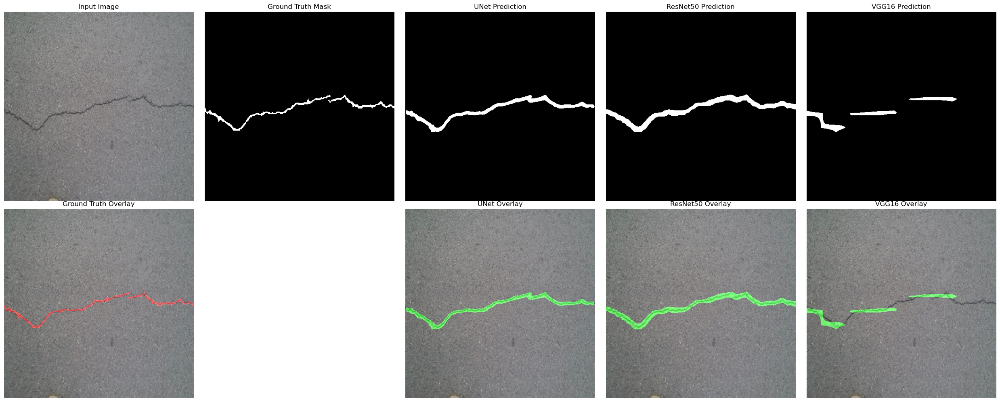

In [31]:
# Models dictionary
models_dict = {
    'UNet': unet_model,
    'ResNet50': resnet_model,
    'VGG16': vgg16_model
}

# Visualize predictions
visualize_predictions(models_dict, test_loader)


In [35]:
import cv2
from PIL import Image

def test_on_unseen_image(models_dict, image_path):
    # Load and preprocess the unseen image
    image = Image.open(image_path).convert('RGB')
    image = data_transforms(image)
    image = image.unsqueeze(0).to(device)  # Add batch dimension and move to device
    
    # Denormalize the input image for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    
    image_np = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    image_np = std * image_np + mean
    image_np = np.clip(image_np, 0, 1)
    image_uint8 = (image_np * 255).astype(np.uint8)
    
    # Get model predictions and overlays
    predictions = {}
    overlays = {}
    color_map = {
        'UNet': [0, 255, 0],        # Green
        'ResNet50': [0, 0, 255],    # Blue
        'VGG16': [255, 0, 255],     # Magenta
    }
    alpha = 0.5  # Transparency for overlays
    for name, model in models_dict.items():
        model.eval()
        with torch.no_grad():
            if name == 'ResNet50':
                outputs = model(image)['out']
            else:
                outputs = model(image)
            preds = torch.argmax(outputs, dim=1).squeeze(0).cpu().numpy()
            predictions[name] = preds

            # Create a colored mask for the prediction
            pred_mask_colored = np.zeros((preds.shape[0], preds.shape[1], 3), dtype=np.uint8)
            pred_mask_colored[preds == 1] = color_map.get(name, [0, 255, 0])  # Default to green if name not in color_map

            # Overlay predicted mask on the original image
            overlay = cv2.addWeighted(image_uint8, 1, pred_mask_colored, alpha, 0)
            overlays[name] = overlay
    
    # Display the results
    num_models = len(models_dict)
    num_columns = num_models + 1  # Including the input image
    fig_height = 6  # Adjust the figure height as needed
    fontsize = 16   # Adjust the font size as needed

    fig, axes = plt.subplots(2, num_columns, figsize=(5 * num_columns, fig_height * 2))
    
    # First Row: Input Image and Predictions
    axes[0, 0].imshow(image_np)
    axes[0, 0].set_title('Input Image', fontsize=fontsize)
    axes[0, 0].axis('off')

    for idx, (name, pred_mask) in enumerate(predictions.items()):
        axes[0, idx + 1].imshow(pred_mask, cmap='gray')
        axes[0, idx + 1].set_title(f'{name} Prediction', fontsize=fontsize)
        axes[0, idx + 1].axis('off')

    # Second Row: Overlays
    axes[1, 0].axis('off')  # Empty subplot under the input image
    for idx, name in enumerate(models_dict.keys()):
        axes[1, idx + 1].imshow(overlays[name])
        axes[1, idx + 1].set_title(f'{name} Overlay', fontsize=fontsize)
        axes[1, idx + 1].axis('off')
    
    plt.tight_layout()
    plt.show()


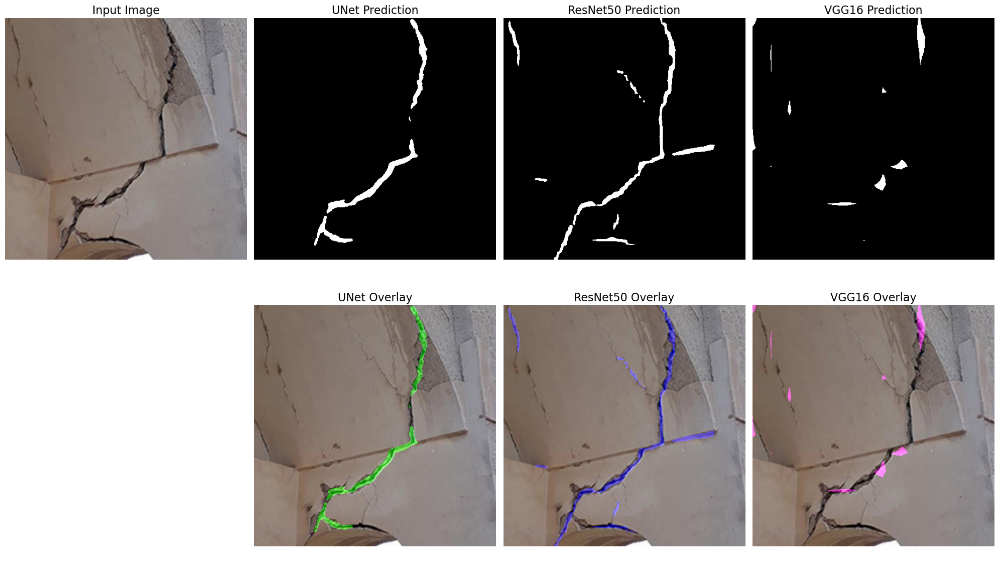

In [36]:
unseen_image_path = '20210506_1633371_jpg.rf.f7df9d161007e83b1e89afc395d66e23.jpg'  

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

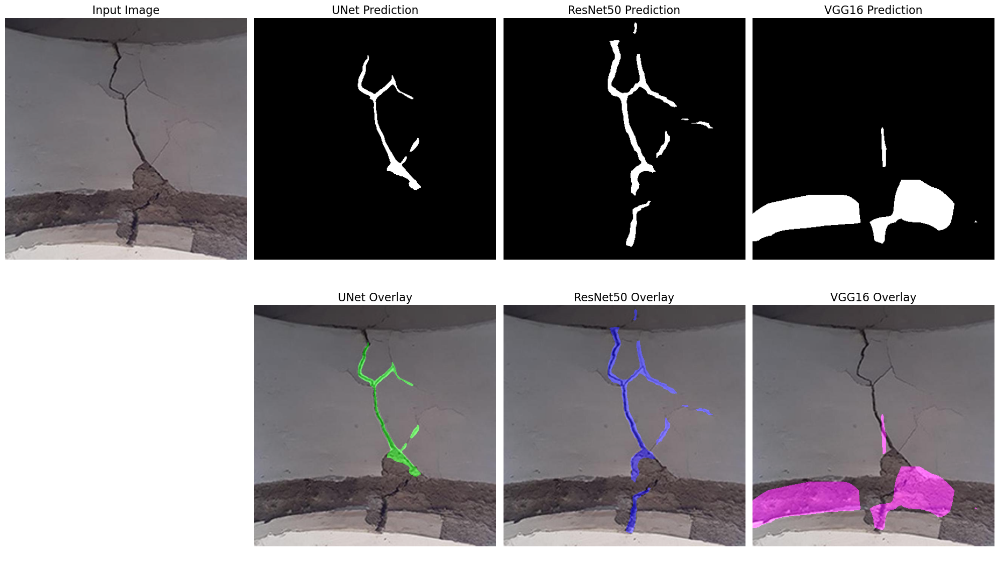

In [37]:

unseen_image_path = '20210506_164816_jpg.rf.48a151ca187d4da0cfa4ce228477c9a7.jpg'  
# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

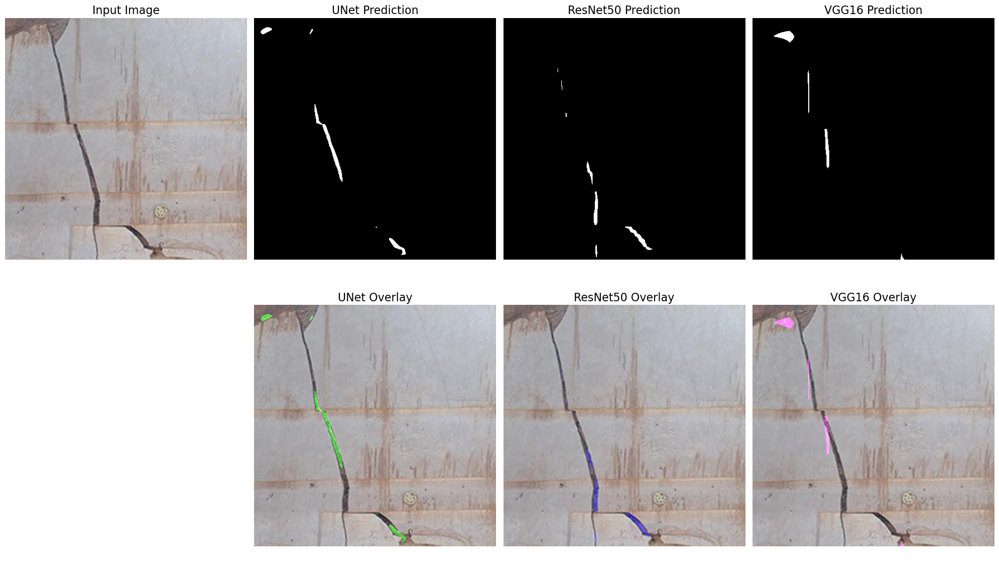

In [38]:

unseen_image_path = '20210506_1458571_jpg.rf.55b64561a4ee965f570c4cbf13aeb0f8.jpg'  

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

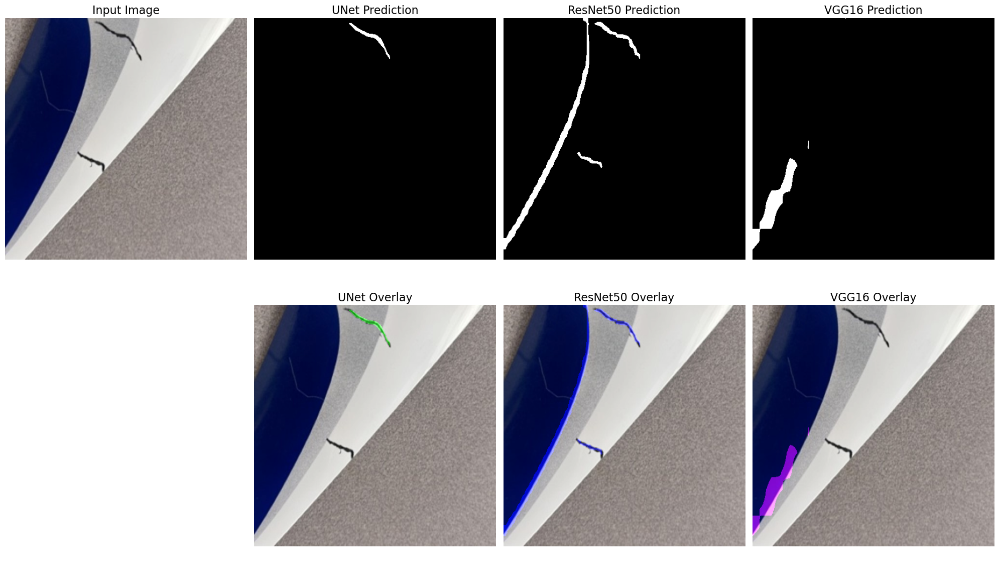

In [39]:

unseen_image_path = 'Picture1.jpg'

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

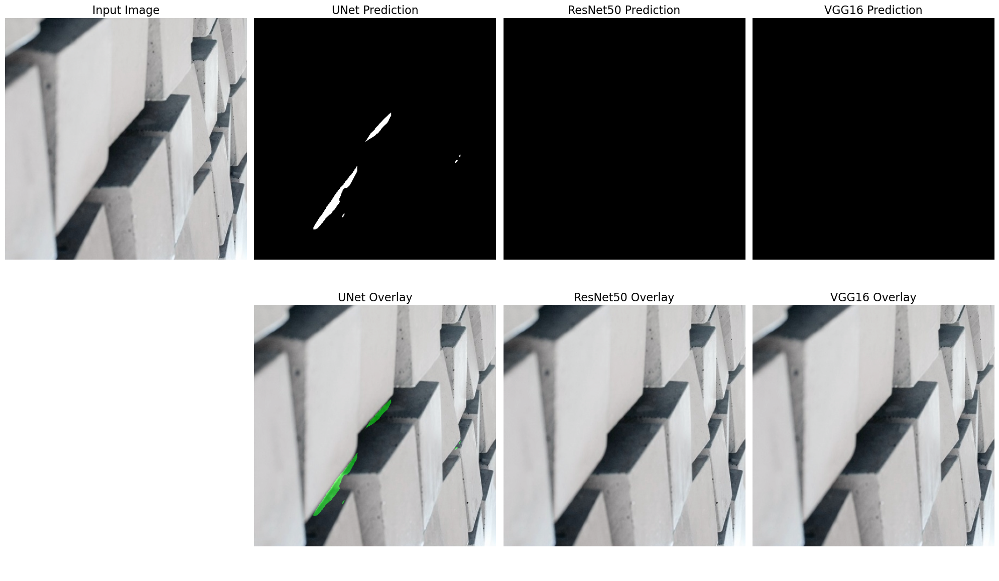

In [40]:

unseen_image_path = 'noncrack_noncrack_concrete_wall_2_1.jpg.jpg' 

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

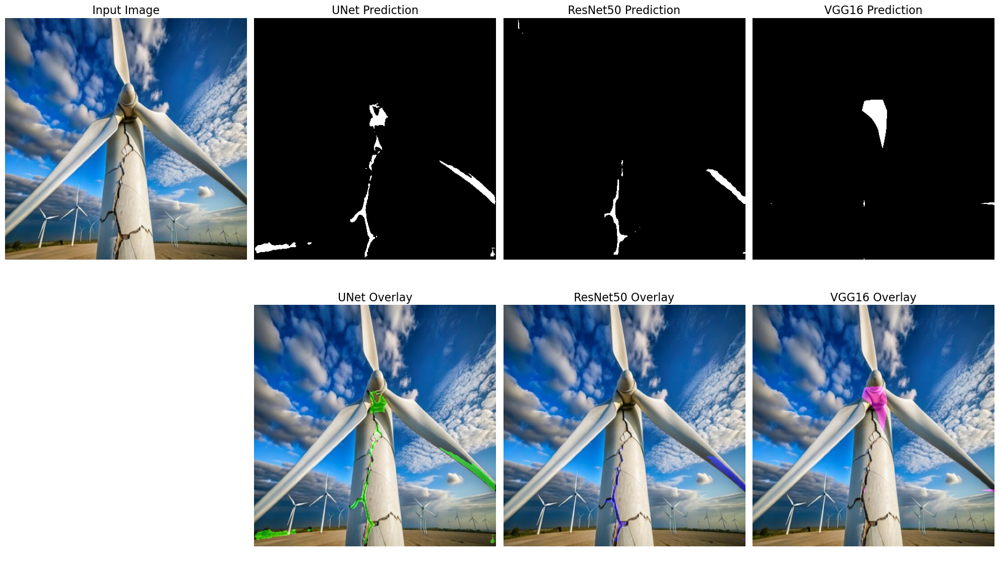

In [41]:

unseen_image_path = 'Wind Turbine Damage Images – Browse 1,500 Stock Photos, Vectors, and Video  _ Adobe Stock.png' 

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

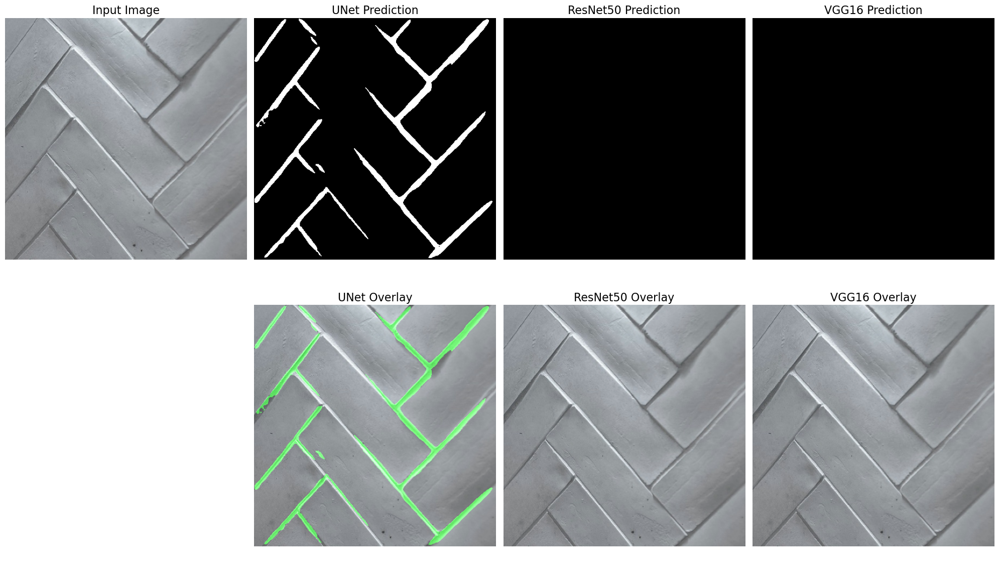

In [42]:

unseen_image_path = 'noncrack_noncrack_concrete_wall_13_7.jpg.jpg' 

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)

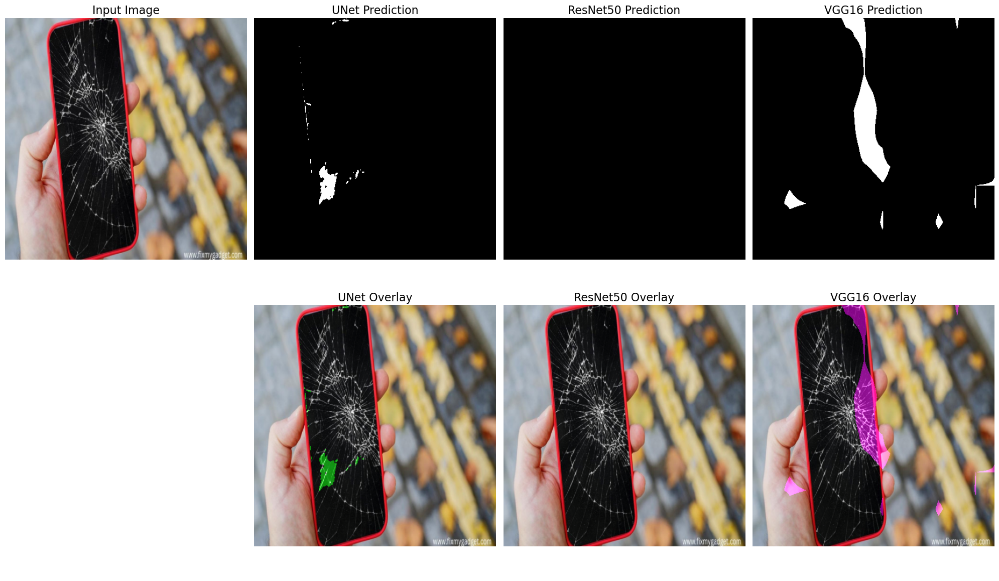

In [43]:

unseen_image_path = 'How To Fix Broken Screen On Android Phone_ - Fix My Gadget.png' 

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)


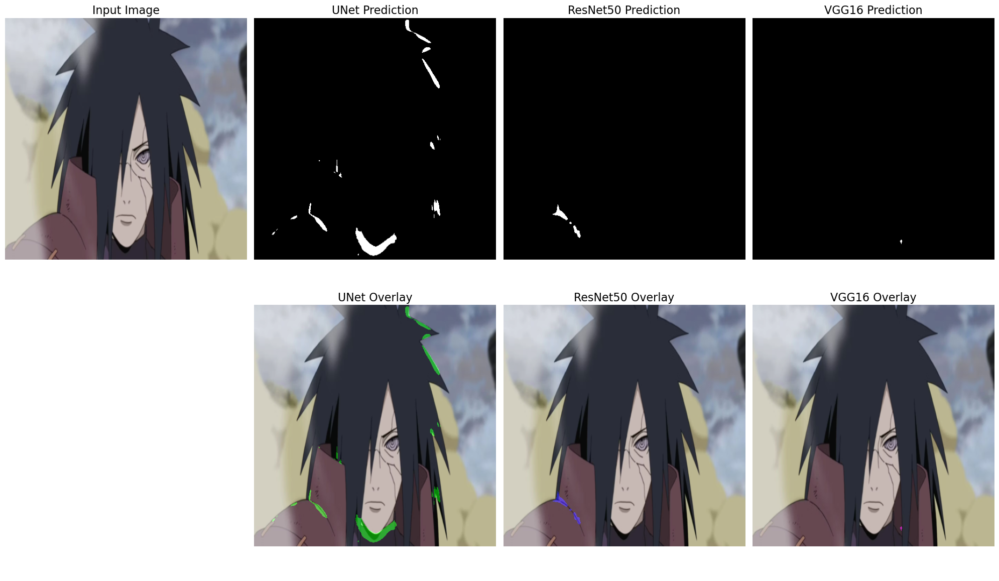

In [45]:

unseen_image_path = 'N.png' 

# Test the models on the unseen image
test_on_unseen_image(models_dict, unseen_image_path)